<a href="https://colab.research.google.com/github/Nabila45/fresh-or-rotten-fruit-detection/blob/main/Fruits_fresh_and_rotten_for_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"nabila45","key":"58d2866e611059efbf8f541980314c34"}'}

In [ ]:
! mkdir ~/.kaggle/

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d sriramr/fruits-fresh-and-rotten-for-classification

100% 3.58G/3.58G [02:54<00:00, 23.8MB/s]
100% 3.58G/3.58G [02:54<00:00, 22.1MB/s]


In [ ]:
!unzip /content/fruits-fresh-and-rotten-for-classification.zip

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.02.09 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.02.18 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.02.24 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.02.37 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.02.51 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.03.02 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.03.12 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.03.21 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07 at 3.03.31 PM.png  
  inflating: dataset/train/rottenapples/rotated_by_60_Screen Shot 2018-06-07

#Library import here

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from keras.models import Model,Sequential
from keras.layers import Conv2D, GlobalAveragePooling2D, Dropout, Flatten, Dense, Activation,GlobalMaxPooling2D
from tensorflow.keras.applications.inception_v3 import InceptionV3
from sklearn.metrics import confusion_matrix,classification_report
from tensorflow.keras.optimizers import Adam
import tensorflow as tf


In [ ]:
import os

def count_files(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len(files)
    return count

dataset_path = '/content/dataset/dataset'
total_images = count_files(dataset_path)
print(f'Total number of images: {total_images}')

Total number of images: 0


In [ ]:
# list paths of train and test datasets
os.listdir('/content/dataset')

['test', 'train', 'dataset']

In [ ]:
TRAIN_PATH = '/content/dataset/train'
TEST_PATH = '/content/dataset/test'
SIZE = (240, 240)

In [ ]:
labels = []
for class_ in os.listdir(TRAIN_PATH):
    labels.append(class_)
NUM_LABELS = len(labels)

print(labels)

['freshoranges', 'rottenoranges', 'rottenbanana', 'rottenapples', 'freshapples', 'freshbanana']


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

datagen=ImageDataGenerator(rescale=1./255, validation_split = 0.1)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dataset = datagen.flow_from_directory(batch_size=32,
                                                 directory=TRAIN_PATH,
                                                 shuffle=True,
                                                classes=labels,
                                                 target_size=SIZE,
                                                 subset="training",
                                                 class_mode='categorical')

val_dataset = datagen.flow_from_directory(batch_size=32,
                                                 directory=TRAIN_PATH,
                                                 shuffle=True,
                                                classes=labels,
                                                 target_size=SIZE,
                                                 subset="validation",
                                                 class_mode='categorical')

Found 9813 images belonging to 6 classes.
Found 1088 images belonging to 6 classes.


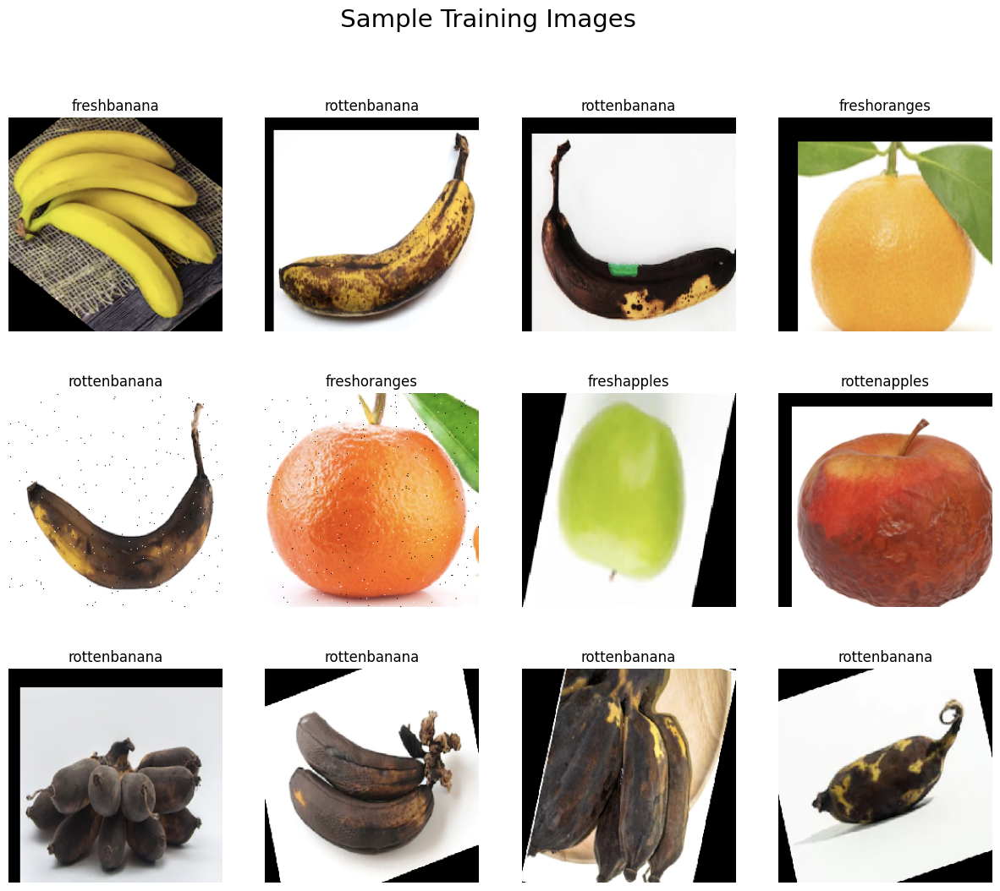

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(15, 12))
idx = 0

for i in range(3):
    for j in range(4):
        label = labels[np.argmax(train_dataset[0][1][idx])]
        ax[i, j].set_title(f"{label}")
        ax[i, j].imshow(train_dataset[0][0][idx][:, :, :])
        ax[i, j].axis("off")
        idx += 1

# plt.tight_layout()
plt.suptitle(" Sample Training Images", fontsize=21)
plt.show()

##Customised CNN


In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape = (240,240,3)))
model.add(tf.keras.layers.MaxPool2D((2,2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(tf.keras.layers.MaxPool2D((2,2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Conv2D(128, kernel_size=(3,3), activation='relu'))
model.add(tf.keras.layers.MaxPool2D((2,2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(64, activation='relu'))

model.add(tf.keras.layers.Dense(6, activation='softmax'))
model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 119, 119, 32)      0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 119, 119, 32)      0         
                                                                 
 conv2d_7 (Conv2D)           (None, 117, 117, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 58, 58, 64)        0         
 g2D)                                                            
                                                                 
 dropout_7 (Dropout)         (None, 58, 58, 64)       

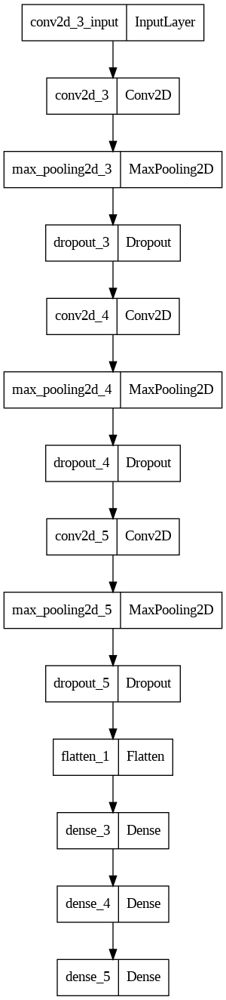

In [ ]:
tf.keras.utils.plot_model(model)

In [ ]:
history = model.fit_generator(generator=train_dataset, steps_per_epoch=len(train_dataset), epochs=15, validation_data=val_dataset, validation_steps=len(val_dataset))

<ipython-input-22-80a22f47c22e>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator=train_dataset, steps_per_epoch=len(train_dataset), epochs=15, validation_data=val_dataset, validation_steps=len(val_dataset))


Epoch 1/15
307/307 [==============================] - 71s 188ms/step - loss: 0.7413 - accuracy: 0.7273 - val_loss: 0.4505 - val_accuracy: 0.8612
Epoch 2/15
307/307 [==============================] - 55s 178ms/step - loss: 0.2876 - accuracy: 0.8921 - val_loss: 0.2332 - val_accuracy: 0.9283
Epoch 3/15
307/307 [==============================] - 59s 193ms/step - loss: 0.1952 - accuracy: 0.9282 - val_loss: 0.1537 - val_accuracy: 0.9605
Epoch 4/15
307/307 [==============================] - 54s 176ms/step - loss: 0.1450 - accuracy: 0.9474 - val_loss: 0.1099 - val_accuracy: 0.9660
Epoch 5/15
307/307 [==============================] - 53s 172ms/step - loss: 0.1160 - accuracy: 0.9568 - val_loss: 0.1339 - val_accuracy: 0.9467
Epoch 6/15
307/307 [==============================] - 53s 171ms/step - loss: 0.0867 - accuracy: 0.9692 - val_loss: 0.1184 - val_accuracy: 0.9550
Epoch 7/15
307/307 [==============================] - 54s 175ms/step - loss: 0.0728 - accuracy: 0.9744 - val_loss: 0.0783 - val_ac

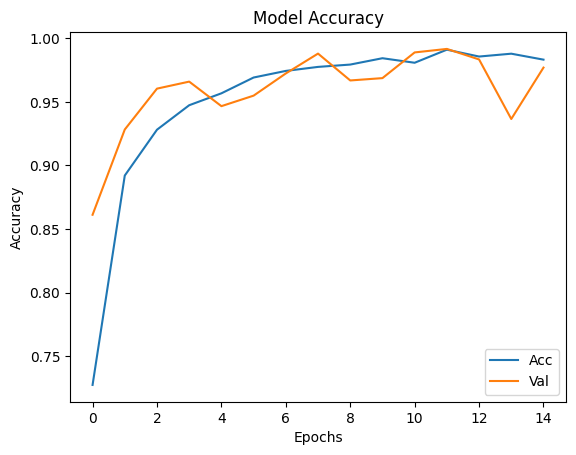

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'lower right')

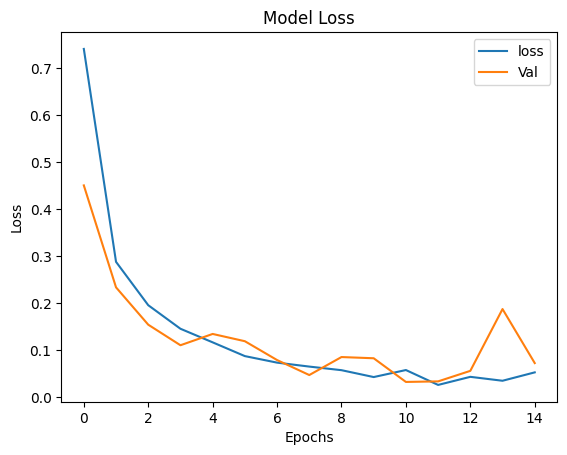

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper right')

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(TEST_PATH,
                                                  batch_size=1,
                                                  target_size=SIZE,
                                                  shuffle = False,
                                                  classes=labels,
                                                  class_mode='categorical')


filenames = test_generator.filenames
nb_samples = len(filenames)

loss, acc = model.evaluate(test_generator,steps = (nb_samples), verbose=1)
print('accuracy test: ',acc)
print('loss test: ',loss)

Found 2698 images belonging to 6 classes.
2698/2698 [==============================] - 18s 7ms/step - loss: 0.1413 - accuracy: 0.9492
accuracy test:  0.949221670627594
loss test:  0.14134177565574646


In [ ]:
predictions = model.predict(test_generator)
files=test_generator.filenames
class_dict=test_generator.class_indices # a dictionary of the form class name: class index
rev_dict={}
for key, value in class_dict.items():
    rev_dict[value]=key

for i, p in enumerate(predictions):
    index=np.argmax(p)
    klass=rev_dict[index]
    prob=p[index]

2698/2698 [==============================] - 17s 6ms/step


In [ ]:
print(len(test_generator[0][0]))
print(test_generator[0][1].shape)

1
(1, 6)


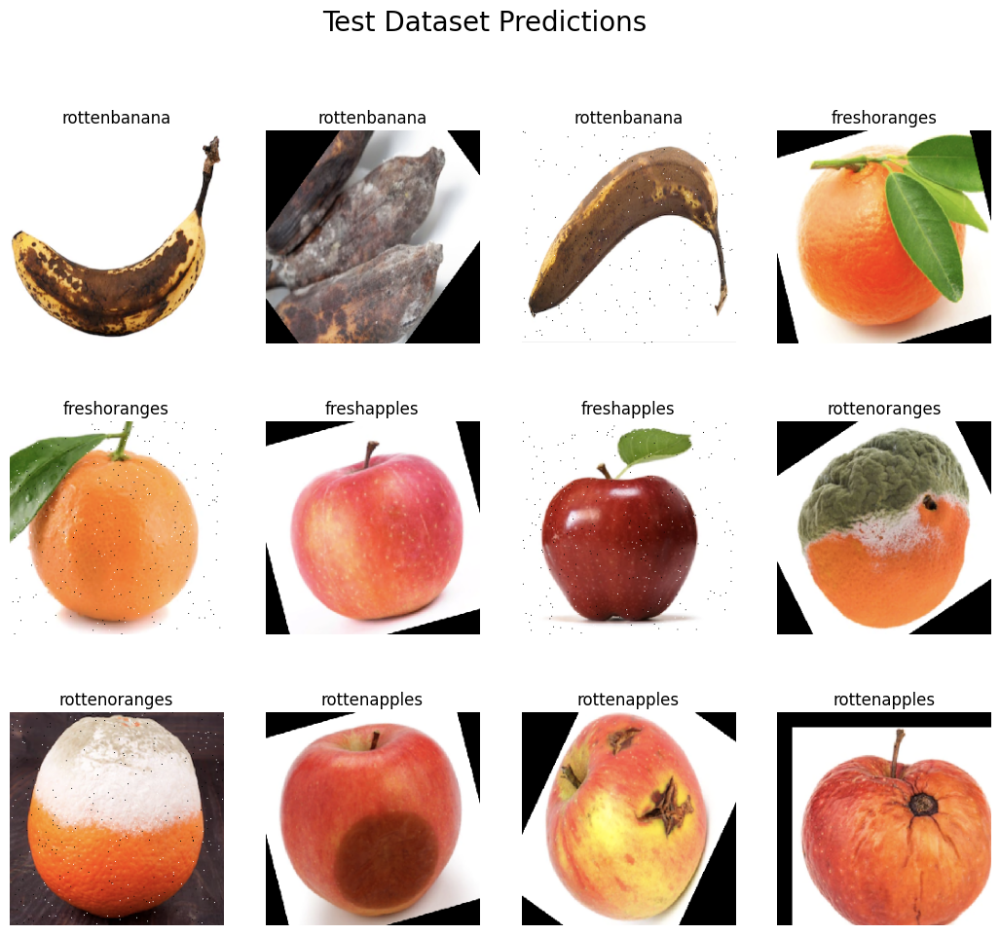

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(13, 11))
idx = 0

for i in range(3):
    for j in range(4):
        predicted_label = labels[np.argmax(predictions[idx])]
        ax[i, j].set_title(f"{predicted_label}")
        ax[i, j].imshow(test_generator[idx][0].reshape(240,240,3))
        ax[i, j].axis("off")
        idx += 200

# plt.tight_layout()
plt.suptitle("Test Dataset Predictions", fontsize=20)
plt.show()

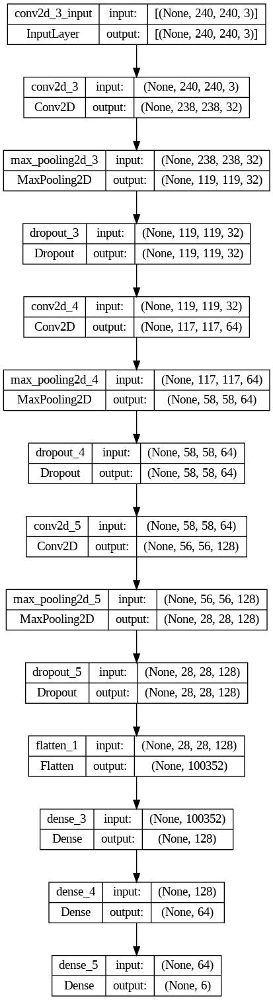

In [ ]:

tf.keras.utils.plot_model(
model, to_file='model.png', show_shapes=True, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

In [ ]:
!pip install keras.utils

  Preparing metadata (setup.py) ... done
  Created wheel for keras.utils: filename=keras_utils-1.0.13-py3-none-any.whl size=2632 sha256=44984a039a41a5815ce220cedfc69c2bd403d6e5247d496d55a2af8bc8a3900a
  Stored in directory: /root/.cache/pip/wheels/5c/c0/b3/0c332de4fd71f3733ea6d61697464b7ae4b2b5ff0300e6ca7a
Successfully built keras.utils


In [ ]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 18.2 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras import layers
from collections import defaultdict
# from PIL import ImageFont
# font = ImageFont.truetype("arial.ttf", 12)
color_map = defaultdict(dict) #customize the colours
color_map[layers.Conv2D]['fill'] = '#00f5d4'
color_map[layers.MaxPooling2D]['fill'] = '#8338ec'
color_map[layers.Dropout]['fill'] = '#03045e'
color_map[layers.Dense]['fill'] = '#fb5607'
color_map[layers.Flatten]['fill'] = '#ffbe0b'

In [ ]:
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

In [ ]:
print(true_classes)
print(class_labels)

[0 0 0 ... 5 5 5]
['rottenbanana', 'freshoranges', 'freshapples', 'rottenoranges', 'rottenapples', 'freshbanana']


In [ ]:
test_steps_per_epoch = np.math.ceil(test_generator.samples / test_generator.batch_size)

predictions = model.predict_generator(test_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)

<ipython-input-46-e10bbc112ad2>:3: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = model.predict_generator(test_generator, steps=test_steps_per_epoch)


In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

               precision    recall  f1-score   support

 rottenbanana       0.97      0.99      0.98       530
 freshoranges       0.92      0.98      0.95       388
  freshapples       0.96      0.98      0.97       395
rottenoranges       0.91      0.89      0.90       403
 rottenapples       0.94      0.90      0.92       601
  freshbanana       1.00      0.97      0.98       381

     accuracy                           0.95      2698
    macro avg       0.95      0.95      0.95      2698
 weighted avg       0.95      0.95      0.95      2698



In [ ]:
print('Confusion Matrix')
# print(confusion_matrix(test_generator.classes, predicted_classes))
cm = confusion_matrix(test_generator.classes, predicted_classes)

Confusion Matrix


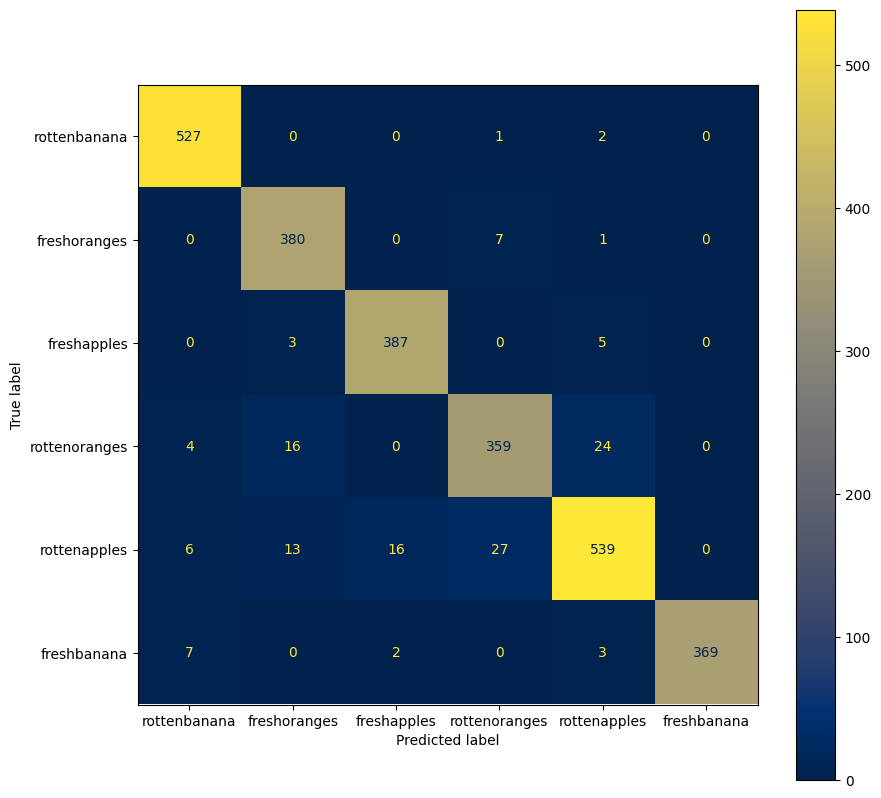

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(test_generator.classes, predicted_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax=ax,cmap="cividis")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import random
import os

from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array,load_img
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import GlobalAveragePooling2D,GlobalMaxPooling2D
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

from keras.applications.vgg16 import VGG16, preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D

from sklearn.metrics import confusion_matrix,classification_report

## VGG16


In [ ]:
def create_model(input_shape, n_classes, optimizer='rmsprop', fine_tune=0):

    # Pretrained convolutional layers are loaded using the Imagenet weights.
    # Include_top is set to False, in order to exclude the model's fully-connected layers.
    conv_base = VGG16(include_top=False, weights='imagenet', input_shape=input_shape)

    # Defines how many layers to freeze during training.
    # Layers in the convolutional base are switched from trainable to non-trainable
    # depending on the size of the fine-tuning parameter.
    if fine_tune > 0:
        for layer in conv_base.layers[:-fine_tune]:
            layer.trainable = False
    else:
        for layer in conv_base.layers:
            layer.trainable = False

    # Create a new 'top' of the model (i.e. fully-connected layers).
    top_model = conv_base.output

    # Add Global Average pooling layer
    top_model = GlobalAveragePooling2D()(top_model)

    # Add output layer
    output_layer = Dense(n_classes, activation='softmax')(top_model)

    # Group the convolutional base and new fully-connected layers into a Model object.
    model = Model(inputs=conv_base.input, outputs=output_layer)

    # Compile the model for training.
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

input_shape = (224, 224, 3)
n_classes=6

# First we'll train the model without Fine-tuning
vgg_model = create_model(input_shape, n_classes, fine_tune=0)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
checkpoint_filepath = 'vgg16_model_best_weights.h5'
# Model weights are saved at the end of every epoch, if it's the best seen so far.
checkpoint = ModelCheckpoint(filepath=checkpoint_filepath,save_weights_only=True,monitor='val_accuracy',mode='max',save_best_only=True,verbose=1)

# EarlyStopping
#early_stop = EarlyStopping(monitor='val_loss',patience=10,restore_best_weights=True,mode='min')

vgg_history = vgg_model.fit(train_dataset,validation_data=val_dataset,
          steps_per_epoch=train_dataset.samples/train_dataset.batch_size,
          validation_steps=val_dataset.samples/val_dataset.batch_size,
          epochs=20,callbacks=[checkpoint])

Epoch 1/20
307/306 [==============================] - ETA: 0s - loss: 1.1783 - accuracy: 0.6603
Epoch 1: val_accuracy improved from -inf to 0.83180, saving model to vgg16_model_best_weights.h5
306/306 [==============================] - 69s 203ms/step - loss: 1.1783 - accuracy: 0.6603 - val_loss: 0.7650 - val_accuracy: 0.8318
Epoch 2/20
307/306 [==============================] - ETA: 0s - loss: 0.6654 - accuracy: 0.8484
Epoch 2: val_accuracy improved from 0.83180 to 0.87776, saving model to vgg16_model_best_weights.h5
306/306 [==============================] - 59s 192ms/step - loss: 0.6654 - accuracy: 0.8484 - val_loss: 0.5177 - val_accuracy: 0.8778
Epoch 3/20
307/306 [==============================] - ETA: 0s - loss: 0.4937 - accuracy: 0.8832
Epoch 3: val_accuracy improved from 0.87776 to 0.90717, saving model to vgg16_model_best_weights.h5
306/306 [==============================] - 60s 194ms/step - loss: 0.4937 - accuracy: 0.8832 - val_loss: 0.4068 - val_accuracy: 0.9072
Epoch 4/20
30

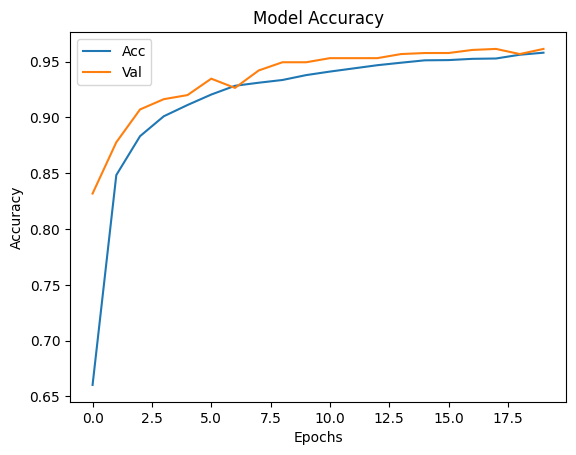

In [ ]:
plt.plot(vgg_history.history['accuracy'])
plt.plot(vgg_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'upper left')

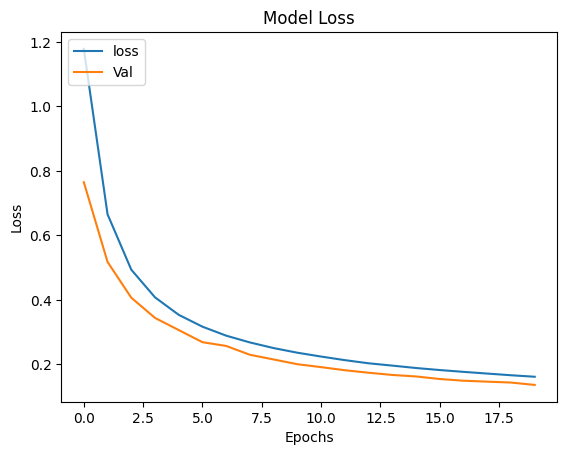

In [ ]:
plt.plot(vgg_history.history['loss'])
plt.plot(vgg_history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper left')

# Resnet 50

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import Callback, LearningRateScheduler
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imutils import paths
import argparse
import cv2










In [ ]:


train_datagen = ImageDataGenerator(rescale=1/255,
                                   rotation_range=15,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
validation_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
                    '/content/dataset/train',
                    target_size = (150,150),
                    batch_size = 15,
                    class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
                    '/content/dataset/test',
                    target_size=(150,150),
                    batch_size= 15,
                    class_mode='categorical')

Found 10901 images belonging to 6 classes.
Found 2698 images belonging to 6 classes.


In [ ]:
baseModel = ResNet50V2(weights="imagenet",include_top=False, input_tensor=Input(shape=(150,150,3)))

headModel=baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(6, activation="softmax")(headModel)

model = Model(inputs=baseModel.input,outputs=headModel)

for layer in baseModel.layers: layer.trainable=False

94668760/94668760 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 156, 156, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 75, 75, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 77, 77, 64)           0         ['conv1_conv[0][0]']          
                                                                                            

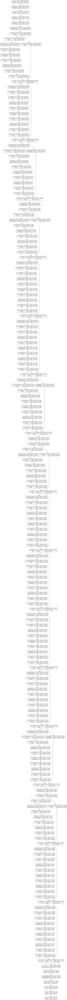

In [ ]:
tf.keras.utils.plot_model(
model, to_file='model.png', show_shapes=True, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

In [ ]:
model.compile(
    loss='binary_crossentropy',
    optimizer = Adam(learning_rate=3e-4),
    metrics=["accuracy"]
)

In [ ]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    steps_per_epoch = len(train_generator)//15,
    validation_steps=len(validation_generator)//15,
    epochs=50,
    verbose=1
)

Epoch 1/50
48/48 [==============================] - 15s 197ms/step - loss: 0.6558 - accuracy: 0.3444 - val_loss: 0.2843 - val_accuracy: 0.6722
Epoch 2/50
48/48 [==============================] - 10s 210ms/step - loss: 0.3663 - accuracy: 0.5861 - val_loss: 0.2165 - val_accuracy: 0.7778
Epoch 3/50
48/48 [==============================] - 8s 157ms/step - loss: 0.2885 - accuracy: 0.6931 - val_loss: 0.1423 - val_accuracy: 0.8889
Epoch 4/50
48/48 [==============================] - 8s 173ms/step - loss: 0.2397 - accuracy: 0.7569 - val_loss: 0.1167 - val_accuracy: 0.9056
Epoch 5/50
48/48 [==============================] - 11s 227ms/step - loss: 0.2179 - accuracy: 0.7889 - val_loss: 0.0933 - val_accuracy: 0.9389
Epoch 6/50
48/48 [==============================] - 8s 157ms/step - loss: 0.2035 - accuracy: 0.8083 - val_loss: 0.0800 - val_accuracy: 0.9556
Epoch 7/50
48/48 [==============================] - 10s 197ms/step - loss: 0.1829 - accuracy: 0.8347 - val_loss: 0.0730 - val_accuracy: 0.9444
Ep

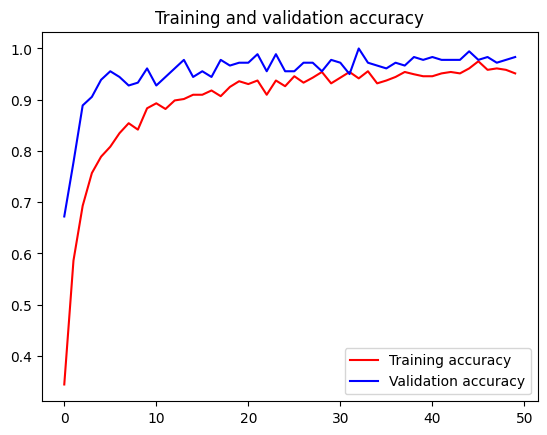

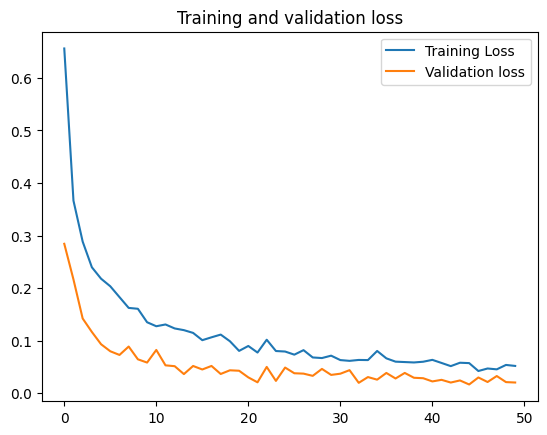

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

plt.plot(epochs,acc,'r', label='Training accuracy')
plt.plot(epochs,val_acc,'b', label='Validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs,loss,label='Training Loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)

In [ ]:
model.evaluate(validation_generator)

180/180 [==============================] - 13s 73ms/step - loss: 0.0252 - accuracy: 0.9759


[0.02520546317100525, 0.975908100605011]

In [ ]:
result = model.evaluate(validation_generator)
print(result)
print('Accuracy: ', result[1])

180/180 [==============================] - 13s 69ms/step - loss: 0.0252 - accuracy: 0.9759
[0.0252054613083601, 0.975908100605011]
Accuracy:  0.975908100605011


#Inception v3

In [ ]:
TRAIN_PATH = "/content/dataset/train"
TEST_PATH = "/content/dataset/test"
BATCH_SIZE = 32
EPOCHS = 5
LEARNING_RATE = 0.001
IMG_SHAPE= (224,224)
## train generator
train_datagen = ImageDataGenerator(rescale=1/255.0,
                                 zoom_range=0.2,
                                 shear_range=0.3,
                                crop_type='random',
                                rotation_range=30,
                                 horizontal_flip=True,
                                 brightness_range=[0.5,1.5])
#test generator
test_datagen = ImageDataGenerator(rescale=1/255.0)

#generate data from train and test directories
train_gen = train_datagen.flow_from_directory(TRAIN_PATH,
                                            target_size=IMG_SHAPE,
                                            batch_size=BATCH_SIZE,
                                            class_mode="binary")

test_gen = test_datagen.flow_from_directory(TEST_PATH,
                                            target_size=IMG_SHAPE,
                                            batch_size=BATCH_SIZE,
                                            class_mode="binary")

Found 10901 images belonging to 6 classes.
Found 2698 images belonging to 6 classes.


In [ ]:
#create Inception Model
inception = InceptionV3(weights='imagenet',input_shape=(224, 224, 3),include_top=False)
#show the base model summary
inception.summary()
#show how manay layers in the Resnet Network
layers = inception.layers
print(f'Number of Layers: {len(layers)}')

87910968/87910968 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_9 (Conv2D)           (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d_9[0][0]']            
 Normalization)                                                                                   
                                                                                                  
 activation (Activatio

In [ ]:
tf.keras.utils.plot_model(
inception, to_file='model.png', show_shapes=True, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

In [ ]:
# number of samples for each set
TRAIN_SIZE = train_gen.samples
TEST_SIZE = test_gen.samples
# early stopping
callbacks = EarlyStopping(patience = 3, monitor='val_acc')

# let's train our Model
inputs = inception.input
# get the output of inception NN and add an average pooling layer
x = inception.output
x = GlobalAveragePooling2D()(x)
# add the a dense layer
x = Dense(512, activation='relu')(x)
# add a dropout
x = Dropout(0.5)(x)
# finally, add an output layer
outputs = Dense(6, activation ='softmax')(x)
# build the model to train
model = Model(inputs=inputs, outputs=outputs)

# freeze all convolutional inception layers
for layer in layers:
    layer.trainable = False

# compile the model
model.compile(optimizer=Adam(lr=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
# train the model for 10 epochs
history = model.fit_generator(
                train_gen,
                epochs= 10,
                validation_data = test_gen,
                validation_steps = TEST_SIZE//BATCH_SIZE,
                steps_per_epoch = TRAIN_SIZE//BATCH_SIZE,
                callbacks = [callbacks])

<ipython-input-84-31efbf9011fc>:30: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/10
340/340 [==============================] - ETA: 0s - loss: 0.2757 - accuracy: 0.9038

340/340 [==============================] - 208s 580ms/step - loss: 0.2757 - accuracy: 0.9038 - val_loss: 0.0955 - val_accuracy: 0.9650
Epoch 2/10
340/340 [==============================] - ETA: 0s - loss: 0.1498 - accuracy: 0.9465

340/340 [==============================] - 193s 566ms/step - loss: 0.1498 - accuracy: 0.9465 - val_loss: 0.0770 - val_accuracy: 0.9743
Epoch 3/10
340/340 [==============================] - ETA: 0s - loss: 0.1171 - accuracy: 0.9556

340/340 [==============================] - 196s 576ms/step - loss: 0.1171 - accuracy: 0.9556 - val_loss: 0.0584 - val_accuracy: 0.9784
Epoch 4/10
340/340 [==============================] - ETA: 0s - loss: 0.1136 - accuracy: 0.9580

340/340 [==============================] - 193s 567ms/step - loss: 0.1136 - accuracy: 0.9580 - val_loss: 0.0740 - val_accuracy: 0.9728
Epoch 5/10
340/340 [==============================] - ETA: 0s - loss: 0.0963 - accuracy: 0.9633

340/340 [==============================] - 190s 557ms/step - loss: 0.0963 - accuracy: 0.9633 - val_loss: 0.0412 - val_accuracy: 0.9859
Epoch 6/10
340/340 [==============================] - ETA: 0s - loss: 0.0921 - accuracy: 0.9655

340/340 [==============================] - 190s 557ms/step - loss: 0.0921 - accuracy: 0.9655 - val_loss: 0.0442 - val_accuracy: 0.9866
Epoch 7/10
340/340 [==============================] - ETA: 0s - loss: 0.0857 - accuracy: 0.9692

340/340 [==============================] - 191s 561ms/step - loss: 0.0857 - accuracy: 0.9692 - val_loss: 0.0355 - val_accuracy: 0.9870
Epoch 8/10
340/340 [==============================] - ETA: 0s - loss: 0.0838 - accuracy: 0.9707

340/340 [==============================] - 191s 563ms/step - loss: 0.0838 - accuracy: 0.9707 - val_loss: 0.0477 - val_accuracy: 0.9814
Epoch 9/10
340/340 [==============================] - ETA: 0s - loss: 0.0697 - accuracy: 0.9746

340/340 [==============================] - 191s 561ms/step - loss: 0.0697 - accuracy: 0.9746 - val_loss: 0.0465 - val_accuracy: 0.9840
Epoch 10/10
340/340 [==============================] - ETA: 0s - loss: 0.0842 - accuracy: 0.9702

340/340 [==============================] - 190s 558ms/step - loss: 0.0842 - accuracy: 0.9702 - val_loss: 0.0387 - val_accuracy: 0.9866


Text(0.5, 0, 'N.of Epochs')

<Figure size 640x480 with 0 Axes>

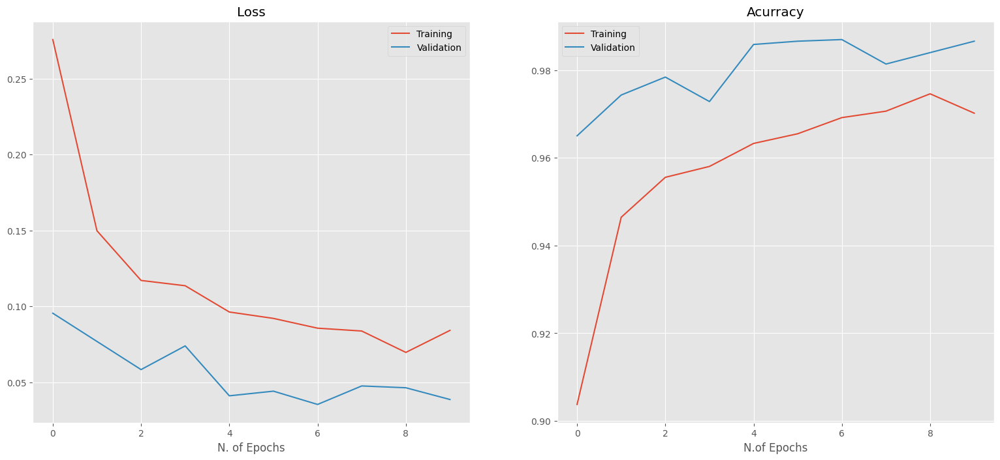

In [ ]:
# Plot training loss vs validation loss
plt.style.use('ggplot')
plt.figure()
fig,(ax1, ax2)=plt.subplots(1,2,figsize=(19,8))
ax1.plot(history.history['loss'])
ax1.plot(history.history['val_loss'])
ax1.legend(['Training','Validation'])
ax1.set_title('Loss')
ax1.set_xlabel('N. of Epochs')
## plot training accuracy vs validation accuracy
ax2.plot(history.history['accuracy'])
ax2.plot(history.history['val_accuracy'])
ax2.legend(['Training','Validation'])
ax2.set_title('Acurracy')
ax2.set_xlabel('N.of Epochs')

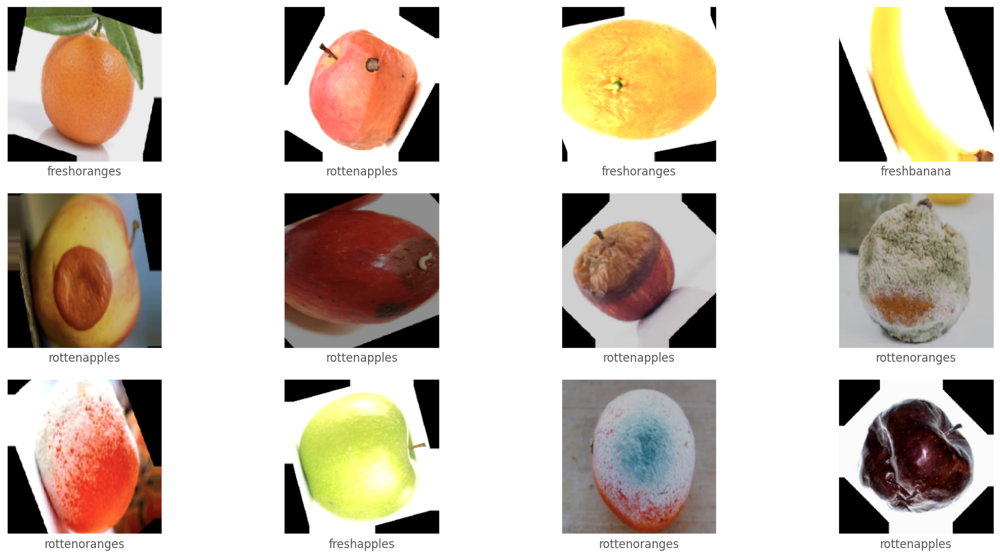

In [ ]:
#get classes dict
classes_dict = dict(test_gen.class_indices)
#reverse
classes_dict = {v: k for k,v in classes_dict.items()}
#let's plot sone images
images,labels=train_gen.next()
plt.figure(figsize=(20,10))
for i in range(12):
    plt.subplot(3,4,i+1)
    plt.imshow(images[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(classes_dict[labels[i]])

85/85 [==============================] - 15s 168ms/step


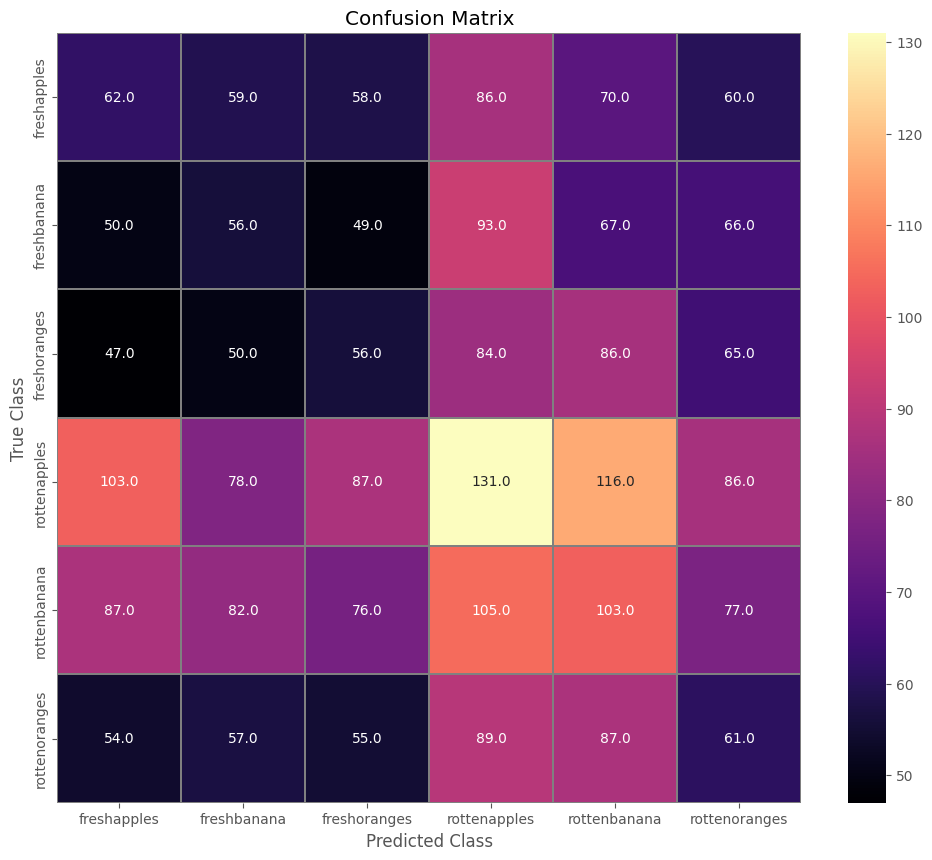

In [ ]:
class_names = list(classes_dict.values())
labels = test_gen.classes
preds =  model.predict(test_gen)
predictions = np.argmax(preds, axis=1)
#show the confusion matrix
conf_matrix = confusion_matrix(labels, predictions)
# plot the confusion matrix
fig,ax = plt.subplots(figsize=(12, 10))
sb.heatmap(conf_matrix, annot=True, linewidths=0.01,cmap="magma",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix")
ax.set_xticklabels(labels = class_names,fontdict=None)
ax.set_yticklabels(labels = class_names,fontdict=None)
plt.show()

1/1 [==============================] - 0s 28ms/step


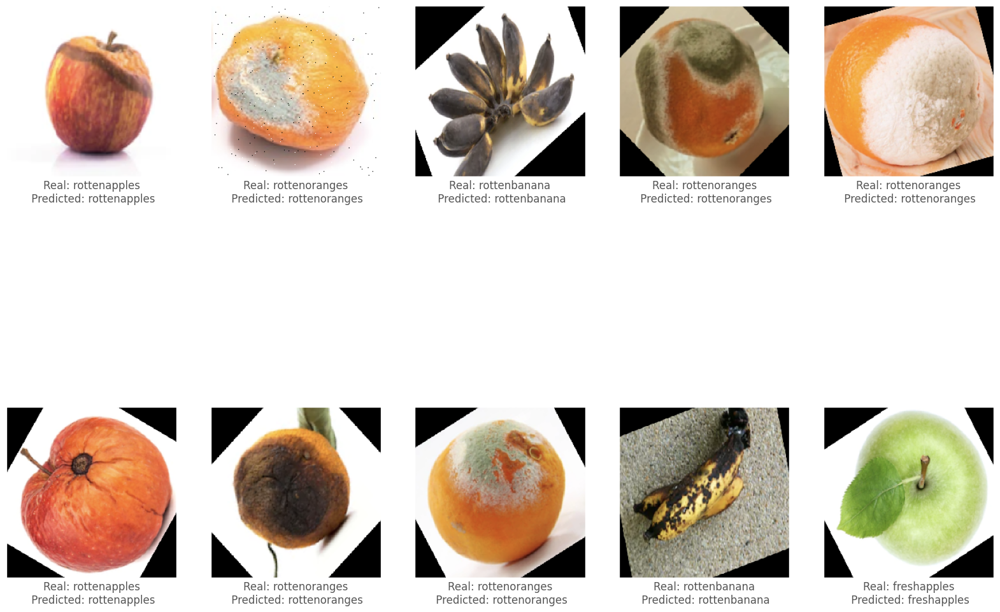

In [ ]:
test_images,test_labels=test_gen.next()
plt.figure(figsize=(20,15))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(test_images[i])
    plt.xticks([])
    plt.yticks([])
    real = classes_dict[test_labels[i]]
    img = test_images[i].reshape(1,224,224,3)
    predicted = int(np.argmax(model.predict(img),axis=1))
    predicted = classes_dict[predicted]
    plt.xlabel(f"Real: {real}\n Predicted: {predicted}")